# Analyse du jeu de données Open Food 
### Le nutri-score de nos aliments est-il fiable ? Qu'en est-il en cas d'absence de ce logo ?

https://www.mangerbouger.fr/Manger-mieux/Comment-manger-mieux/Comment-comprendre-les-informations-nutritionnelles/Qu-est-ce-que-le-Nutri-Score?xtor=SEC-34-GOO-[Nutriscore]--S-[%2Bnutri-score]&gclid=Cj0KCQjwvYSEBhDjARIsAJMn0litMAytAExx_eH2Pm99AJHvKIPGAKK-gyp3svleoqb-m4XeEpGHcVoaAsFnEALw_wcB&gclsrc=aw.ds \
Pour classer chaque produit, des équipes de recherches internationales ont mis au point un score qui prend en compte,\
pour 100 grammes de produit, la teneur :
- en nutriments et aliments à favoriser : fibres, protéines, fruits et légumes
- en nutriments à limiter : énergie, acides gras saturés, sucres, sel

In [1]:
import pandas as pd
import numpy as np


import seaborn as sns
import missingno as msno

import plotly.express as px
from sklearn.decomposition import PCA

# plot interactif / Voila
import bqplot
from bqplot import pyplot as plt
import ipywidgets as widgets
from bqplot import Tooltip


## Import

In [2]:
# import de l'échantillon
data = pd.read_csv("openfood.csv", sep="	")

C:\Users\eloif\anaconda3\envs\env_OC_project2\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


## Pre-traitement

### Repérer les individus et variables pertinents

#### Garder les produits vendus en **France**

In [3]:
df = data
df = df[df['countries'].notna()]

contain_FR = df['countries'].str.contains('FR')  
contain_Fr = df['countries'].str.contains('Fr')  

df = df[contain_FR | contain_Fr]
df['countries']
data_fr = df

#### Nettoyage des doublons

on garde les premieres occurences des variables "code","url","product_name".\
La variable "product_name" contient des doublons.

In [4]:
print("Nombre d'individus original: "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['code'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'code\': "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['url'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'url\': "+ str(data_fr.shape[0]))
data_fr.drop_duplicates(subset=['product_name'], keep = 'first', inplace=True)
print("Nombre d'individus en verifiant les doublons dans \'product_name\': "+ str(data_fr.shape[0]))

Nombre d'individus original: 97851
Nombre d'individus en verifiant les doublons dans 'code': 97847
Nombre d'individus en verifiant les doublons dans 'url': 97847
Nombre d'individus en verifiant les doublons dans 'product_name': 73945


On élimine les variables qui contiennent 70% de valeurs manquantes

In [5]:
nbr_row = data_fr.shape[0]

column_droped = data_fr.isna().sum()[data_fr.isna().sum() >= nbr_row*0.70].index
data_fr.drop(column_droped, axis=1, inplace=True)
data_fr.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands',
       'brands_tags', 'categories', 'categories_tags', 'categories_fr',
       'labels', 'labels_tags', 'labels_fr', 'purchase_places', 'stores',
       'countries', 'countries_tags', 'countries_fr', 'ingredients_text',
       'additives_n', 'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_fr',
       'main_category', 'main_category_fr', 'image_url', 'image_small_url',
       'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g'],
      dtype='ob

#### Selection des variables interessantes

Choix de selection des variables utiles pour notre problèmatique. (voir partie "Le nutri-score de nos aliments...")

In [6]:
col_bad_nutriment = ["saturated-fat_100g","energy_100g","sugars_100g","salt_100g"]
col_good_nutriment = ["fiber_100g","proteins_100g"]
col_info = ["product_name","nutrition_grade_fr"]
col_nutriments = col_good_nutriment + col_bad_nutriment

col_list = col_info + col_nutriments

data_fr = data_fr[col_list]

On aimerait utiliser **"fruits-vegetables-nuts_100g"** mais 94885/97851 NaN

<AxesSubplot:>

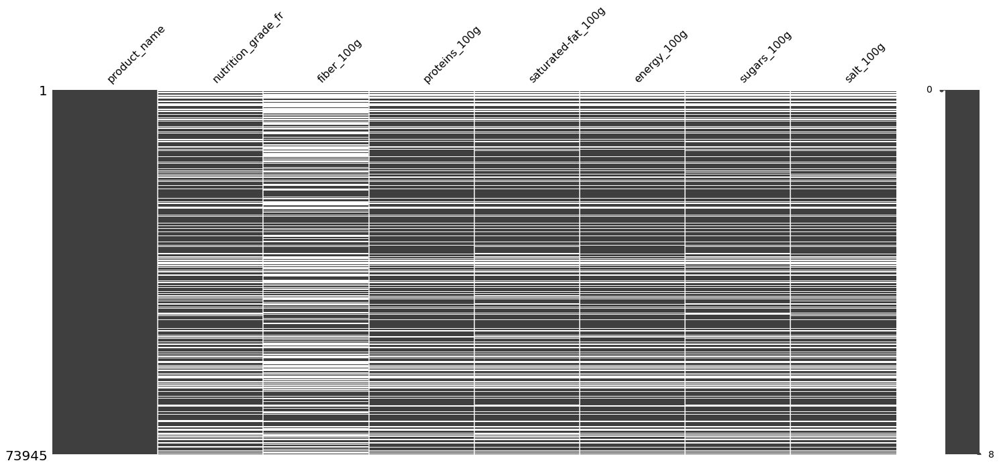

In [7]:
msno.matrix(data_fr)

**Remarque: les valeurs manquantes ont tendance à se concentrer sur les mêmes lignes/individus**\
On retire donc les individus qui présente une valeur manquante sur une des variables qui semble corrélée aux autres.

In [8]:
data_fr.dropna(subset=["saturated-fat_100g"], inplace=True)

<ipython-input-8-93699c120aef>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_fr.dropna(subset=["saturated-fat_100g"], inplace=True)


## I Presentation des données

In [9]:
nbr_row = data_fr.shape[0]
nbr_col = data_fr.shape[1]
print("nombre d'individus : "+ str(nbr_row))
print("nombre de variables : "+ str(nbr_col))
data_numerical = data_fr.select_dtypes(include=np.number)
data_categorical = data_fr.select_dtypes(exclude=np.number)
print("Dont " + str(data_numerical.shape[1]) + " numeriques")
print("Dont " + str(data_categorical.shape[1]) + " categoriques")

nombre d'individus : 50470
nombre de variables : 8
Dont 6 numeriques
Dont 2 categoriques


In [10]:
data_fr

,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
106,Lion Peanut x2,e,2.5,2.5,12.5,1883.0,57.5,0.09652
190,Mini Confettis,d,0.9,0.6,0.8,1753.0,87.7,0.01000
191,Praliné Amande Et Noisette,d,3.9,9.5,2.9,2406.0,50.3,0.00300
226,"Pepsi, Nouveau goût !",e,0.0,0.0,0.0,177.0,10.4,0.02540
234,Tarte Poireaux Et Lardons,d,1.4,7.5,11.0,1079.0,1.0,0.80000
...,...,...,...,...,...,...,...,...
320734,Nature cheddar and red onion crisps,c,5.6,7.8,3.4,2155.0,1.8,1.35000
320740,Verrine Cheescake Myrtille,d,0.0,8.7,12.0,1084.0,10.5,0.29000
320741,Fiche Brevet,b,10.0,10.0,1.0,4.0,1.0,10.00000
320751,Tartines craquantes bio au sarrasin,a,5.9,13.0,0.6,1643.0,2.6,0.68000


### Données manquantes

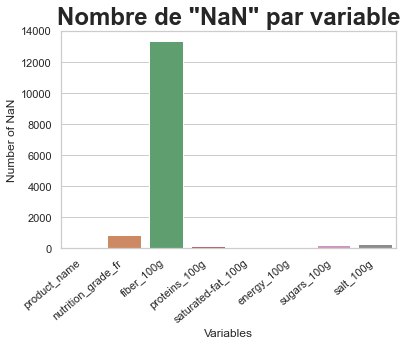

In [11]:
def plot_NaN(data, limite = 0):
    nb_nan = data.isna().sum()
    # pour voir que les colonnes avec NaN > limite
    nb_nan = nb_nan[nb_nan.values >= limite]

    d = {'Variables': nb_nan.index, 'Number of NaN': nb_nan.values}
    nb_nan_df = pd.DataFrame(data=d)
    plt.figure(figsize=(18, 8))

    nb_nan_df1 = nb_nan_df

    sns.set_theme(style="whitegrid")
    ax = sns.barplot(x="Variables", y="Number of NaN", data=nb_nan_df1)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    ax.set_title('Nombre de \"NaN\" par variable', fontdict= { 'fontsize': 24, 'fontweight':'bold'})
    
plot_NaN(data_fr)

<AxesSubplot:>

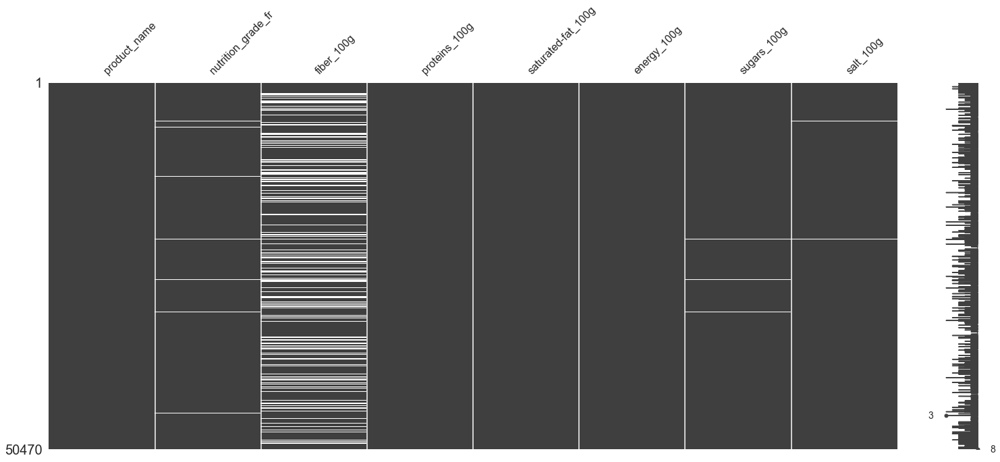

In [12]:
msno.matrix(data_fr)

### Données numeriques

In [13]:
# les moyennes, médianes et quantiles des distributions sont calculées + écart-type
def tablo_descr_val_num(data_numerical):
    stats = {'variable':[], 
            'moyenne':[],
            'ecart-type':[],
            'max':[], 
            'quartile 1':[],
            'quartile 2':[],
            'quartile 3':[],
            'exemple':[]}

    for col in data_numerical.columns:
        stats["variable"].append(col)
        stats["moyenne"].append(data_numerical[col].mean())
        stats["ecart-type"].append(data_numerical[col].std())
        stats["max"].append(data_numerical[col].max())
        stats["quartile 1"].append(data_numerical[col].quantile(q=0.25))
        stats["quartile 2"].append(data_numerical[col].quantile(q=0.5))
        stats["quartile 3"].append(data_numerical[col].quantile(q=0.75))
        stats["exemple"].append(data_numerical[col].unique()[0])

    df = pd.DataFrame(stats) 
    return df

tablo_descr_val_num(data_numerical)

,variable,moyenne,ecart-type,max,quartile 1,quartile 2,quartile 3,exemple
0,fiber_100g,2.557448,4.649453,178.0,0.00000,1.30,3.20,2.50000
1,proteins_100g,7.774573,7.819603,100.0,2.10000,6.00,10.80,2.50000
2,saturated-fat_100g,5.461012,8.449843,210.0,0.35000,2.00,7.50,12.50000
3,energy_100g,1129.189446,1125.585183,182764.0,445.00000,1041.00,1665.00,1883.00000
4,sugars_100g,13.573569,18.821918,104.0,1.10000,4.30,19.00,57.50000
5,salt_100g,1.139029,4.148035,211.0,0.08875,0.55,1.22,0.09652


**Box plot** des variables numeriques (pour visualiser la distribution ainsi que ses quartiles)

In [14]:
for col in data_numerical.columns:
    print(col + " :")
    #ax = sns.boxplot(x=data_numerical[col])
    #plt.show()
    df = data_numerical[col]
    fig = px.box(df, y=col, log_y=True)
    fig.show()
    
    maxi = df.max()
    ele_max = data_fr[data_fr[col] == maxi]
    print("element(s) max")
    display(ele_max)

fiber_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
298897,Milka Schmunzelhase Alpenmilch 175G,e,178.0,6.3,18.0,2218.0,58.0,0.37


proteins_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
127525,Savarez - Jeu De Cordes,a,100.0,100.0,0.1,4.0,0.1,0.0
170118,Harry Potter & The Deathly Hallows Radcliffe /...,a,100.0,100.0,0.0,4.0,0.0,0.0
273543,Le Hobbit : La Bataille Des Cinq Armés - Versi...,a,100.0,100.0,0.0,4.0,0.0,0.0
285429,Marshall - Major Noir,c,100.0,100.0,5.0,21.0,5.0,50.0


saturated-fat_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
245311,mini choux goût fromage de chèvre - poivre,e,0.0,0.0,210.0,18700.0,22.7,9.33


energy_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
249101,"Légume Noisettes Carottes, 500 Grammes, Marque...",d,3.5,4.0,2.0,182764.0,4.5,1.19


sugars_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
202571,Sirop d'Agave brun bio,d,0.0,0.0,0.0,1760.0,104.0,0.14


salt_100g :


element(s) max


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
232239,Keeny Bio,e,0.741,6.3,3.33,1720.0,26.7,211.0


### Données incorrectes

En allant sur le site:\
https://world.openfoodfacts.org/cgi/search.pl \
En cherchant les aliments contenant de forte dose de sucre/sel on constate des produits ayant mal été decrits.

#### Erreur faible
Parfois l'erreur est negligable


#### Erreur forte
Parfois l'erreur est grande


Souvent on retrouve une confusion entre g et mg.\
D'après https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/AI+Engineer/Project+3+-+Pr%C3%A9parez+des+donn%C3%A9es+pour+un+organisme+de+sant%C3%A9+publique/Open_Food_Facts_data-fields.txt \
La quantité est mesuré en g, mais on retrouve beaucoup de mesure correspondant au mg.

Besoins de protéines ? \
On retrouve aussi des articles non alimentaires contenant des nutriments (Il peut y avoir des fausses infos)\
D'autres exemples :\
https://world.openfoodfacts.org/product/0602508854224/lady-gaga-chromatica-k7-rose \
https://world.openfoodfacts.org/product/3346029788657/carolin


En 5 min, n'importe qui peux ajouter un article inventé de toute pièce (testé).\
**En conclusion, les données présentes sur ce site contiennent un certain nombre de valeur incorrectes impactantes**

## II Nettoyage des données

### Nettoyage des valeurs aberrantes

In [15]:
def cleaning(data,columns,seuil=None):
    res = data.copy()
    # if seuil is undefined ==> set it with interquartile range
    if seuil == None:
        seuil = []
        print("default threshold: Q3 + (1.5*IQR) ")
        for col in columns:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            # IQR is interquartile range
            IQR = Q3 - Q1
            limite = Q3 + (1.5*IQR)
            seuil.append(limite)
            print("for "+col+", threshold is: "+str(limite))
    k = 0
    for col in columns:
        #res.loc[res[col] >= seuil[k], col] = None
        res = res.drop(res[res[col] >= seuil[k]].index)
        k += 1
        
    return res

Suprimer les valeurs aberrantes en fonction de leurs nutri-scores.

In [16]:
NEWdata = pd.DataFrame()

#for score in ["a","b","c","d","e"]:
for score in ["e","d","c","b","a"]:
    print("CLEAN "+score+":")
    ss_ensemble = data_fr[data_fr["nutrition_grade_fr"] == score]
    ss_ensemble = cleaning(ss_ensemble, col_nutriments)
    
    NEWdata = NEWdata.append(ss_ensemble)
    
print("CLEAN O:")    
ss_ensemble = data_fr[data_fr["nutrition_grade_fr"] != data_fr["nutrition_grade_fr"]]
ss_ensemble = cleaning(ss_ensemble, col_nutriments)
NEWdata = NEWdata.append(ss_ensemble)

CLEAN e:
default threshold: Q3 + (1.5*IQR) 
for fiber_100g, threshold is: 6.25
for proteins_100g, threshold is: 16.55
for saturated-fat_100g, threshold is: 32.55
for energy_100g, threshold is: 3392.5
for sugars_100g, threshold is: 102.25
for salt_100g, threshold is: 3.5976
CLEAN d:
default threshold: Q3 + (1.5*IQR) 
for fiber_100g, threshold is: 7.75
for proteins_100g, threshold is: 28.2775
for saturated-fat_100g, threshold is: 22.0
for energy_100g, threshold is: 2960.0
for sugars_100g, threshold is: 68.5
for salt_100g, threshold is: 4.068875
CLEAN c:
default threshold: Q3 + (1.5*IQR) 
for fiber_100g, threshold is: 9.25
for proteins_100g, threshold is: 22.400000000000002
for saturated-fat_100g, threshold is: 7.9
for energy_100g, threshold is: 2363.375
for sugars_100g, threshold is: 33.6
for salt_100g, threshold is: 3.0999999999999996
CLEAN b:
default threshold: Q3 + (1.5*IQR) 
for fiber_100g, threshold is: 5.0
for proteins_100g, threshold is: 18.5
for saturated-fat_100g, threshold is: 

In [17]:

print("Nombre d'individus avant supression des lignes: "+str(data_fr.shape[0]))
print("")
#data_fr = cleaning(data_fr, col_nutriments)
#data_fr.dropna(inplace=True)
print("")
print("Nombre d'individus apres supression des lignes: "+str(NEWdata.shape[0]))
data_fr = NEWdata

Nombre d'individus avant supression des lignes: 50470


Nombre d'individus apres supression des lignes: 39707


### Imputation des valeurs manquantes

#### Imputation variables catégorielles

In [18]:
data_fr["nutrition_grade_fr"] = data_fr["nutrition_grade_fr"].fillna("O")

#### Imputation variables numériques

On remplace les valeurs numeriques manquantes par la **moyenne de leurs variables en considerant leurs nutri-scores**.

In [19]:
for col in col_nutriments:
    print("variable "+col+" :")
    for score in ["a","b","c","d","e","O"]:
        ss_ensemble = data_fr[data_fr["nutrition_grade_fr"] == score]
        print("replace NaN of nutri-score "+score+" by :")
        score_fiber_mean = ss_ensemble[col].mean()
        print(score_fiber_mean)
        ss_ensemble[col].fillna(score_fiber_mean, inplace=True)
        data_fr[data_fr["nutrition_grade_fr"] == score] = ss_ensemble

variable fiber_100g :
replace NaN of nutri-score a by :
3.006411656554508
replace NaN of nutri-score b by :
1.0220077110389623
replace NaN of nutri-score c by :
1.7273714900153667
replace NaN of nutri-score d by :
1.6183612949434245
replace NaN of nutri-score e by :
1.3761590949621056
replace NaN of nutri-score O by :
2.1052600609756107
variable proteins_100g :
replace NaN of nutri-score a by :
7.456079528222433
replace NaN of nutri-score b by :
4.270862514211462
replace NaN of nutri-score c by :
6.437367831311871
replace NaN of nutri-score d by :
8.81775685587913
replace NaN of nutri-score e by :
5.835924231940217
replace NaN of nutri-score O by :
7.376002141327623
variable saturated-fat_100g :
replace NaN of nutri-score a by :
0.46181258466722547
replace NaN of nutri-score b by :
0.9627142277083118


C:\Users\eloif\anaconda3\envs\env_OC_project2\lib\site-packages\pandas\core\series.py:4517: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



replace NaN of nutri-score c by :
2.121510303772118
replace NaN of nutri-score d by :
6.339331521378525
replace NaN of nutri-score e by :
11.898183919180777
replace NaN of nutri-score O by :
2.636711454545455
variable energy_100g :
replace NaN of nutri-score a by :
718.906943555181
replace NaN of nutri-score b by :
451.8909972389147
replace NaN of nutri-score c by :
771.4958239679537
replace NaN of nutri-score d by :
1318.3558744931809
replace NaN of nutri-score e by :
1719.668462634929
replace NaN of nutri-score O by :
824.3376822429907
variable sugars_100g :
replace NaN of nutri-score a by :
2.50943641112048
replace NaN of nutri-score b by :
4.123100535975308
replace NaN of nutri-score c by :
7.687667306108826
replace NaN of nutri-score d by :
15.57808418724665
replace NaN of nutri-score e by :
30.28705507888179
replace NaN of nutri-score O by :
4.332911838790932
variable salt_100g :
replace NaN of nutri-score a by :
0.373908679706822
replace NaN of nutri-score b by :
0.5002037077716

#### drop des valeurs manquantes restantes

Nécessaire si on a des valeurs manquantes dans "product_name".

In [20]:
print("Nombre d'individus avant supression des lignes: "+str(data_fr.shape[0]))
data_fr.dropna(inplace=True)
print("Nombre d'individus apres supression des lignes: "+str(data_fr.shape[0]))

Nombre d'individus avant supression des lignes: 39707
Nombre d'individus apres supression des lignes: 39707


### Visualisation (graphe interactif)

In [21]:
elements_moyens = {}
for score in ["a","b","c","d","e","O"]:
    ele_moyen = []
    for col in col_nutriments:
        ele_moyen.append(data_fr[data_fr["nutrition_grade_fr"] == score][col].mean())
    elements_moyens[score] = ele_moyen
    
df = pd.DataFrame(elements_moyens)
df.index = col_nutriments
display(df)

,a,b,c,d,e,O
fiber_100g,3.006412,1.022008,1.727371,1.618361,1.376159,2.105260
proteins_100g,7.456080,4.270863,6.437368,8.817757,5.835924,7.376002
saturated-fat_100g,0.461813,0.962714,2.121510,6.339332,11.898184,2.636711
energy_100g,718.906944,451.890997,771.495824,1318.355874,1719.668463,824.337682
sugars_100g,2.509436,4.123101,7.687667,15.578084,30.287055,4.332912
salt_100g,0.373909,0.500204,0.801620,1.075668,0.672623,1.115362


In [22]:
# On divise l'energie par 100 pour avoir es memes ordres de grandeur
df_plot = df.copy()
df_plot.loc["energy_100g"] = df_plot.loc["energy_100g"]/100
df_plot = df_plot.rename(index={'energy_100g': 'energy_100g /100'})

#### Stacked bar Chart

In [23]:
box_fiber = widgets.Checkbox(
    value=True,
    description='fiber',
    disabled=False,
    indent=False
)
box_proteins = widgets.Checkbox(
    value=True,
    description='proteins',
    disabled=False,
    indent=False
)
box_fat = widgets.Checkbox(
    value=True,
    description='saturated-fat',
    disabled=False,
    indent=False
)
box_energy = widgets.Checkbox(
    value=True,
    description='energy',
    disabled=False,
    indent=False
)
box_sugar = widgets.Checkbox(
    value=True,
    description='sugar',
    disabled=False,
    indent=False
)
box_salt = widgets.Checkbox(
    value=True,
    description='salt',
    disabled=False,
    indent=False
)
box_legend = widgets.Checkbox(
    value=True,
    description='switch legend pos',
    disabled=False,
    indent=False
)

def up(change):
    liste_checkBox = []
    liste_checkBox.append(box_fiber.value)
    liste_checkBox.append(box_proteins.value)
    liste_checkBox.append(box_fat.value)
    liste_checkBox.append(box_energy.value)
    liste_checkBox.append(box_sugar.value)
    liste_checkBox.append(box_salt.value)
    
    np_col_nutriments = np.array(list(df_plot.index))
    filter = np.array(liste_checkBox)
    bar_chart.labels = list(np_col_nutriments[filter])
    bar_chart.y = df_plot[liste_checkBox]
    if box_legend.value: fig.legend_location = 'top-right'
    else: fig.legend_location = 'top-left'

box_fiber.observe(up, 'value')
box_proteins.observe(up, 'value')
box_fat.observe(up, 'value')
box_energy.observe(up, 'value')
box_sugar.observe(up, 'value')
box_salt.observe(up, 'value')
box_legend.observe(up, 'value')

In [37]:
fig = plt.figure(title="Average Nutriments Per Nutri-score (corrected data)",
                fig_margin={'top':50, 'bottom':20, 'left':60, 'right':150},
                legend_location = 'top-left')

legende = list(df_plot.index)

bar_chart  = plt.bar(x = ["a","b","c","d","e","O"], y= df_plot.loc[df_plot.index],
                     labels=legende,
                     display_legend=True)
bar_chart.type = "stacked"

bar_chart.colors = bqplot.CATEGORY10

bar_chart.tooltip = Tooltip(fields=["x", "y"], labels=["Nutri-score", "Avg Nutriment"])

plt.xlabel("Nutri-score")
plt.ylabel("Nutriments (g or kJ/100)")

In [38]:
checkBox_layout = widgets.HBox([box_fiber, box_proteins, box_fat, box_energy, box_sugar, box_salt])
final_layout = widgets.VBox([checkBox_layout, box_legend, fig])
final_layout

### Post traitement des données / préparation des données pour leurs étude

#### Mise à l'echelle centrer-réduire

In [26]:
# Centrage et Reduction
from sklearn import preprocessing

df = data_fr.dropna().copy()
features = col_bad_nutriment + col_good_nutriment

std_scale = preprocessing.StandardScaler().fit(df[features])
df[features] = std_scale.transform(df[features])

df_scale = df.copy()
display(df_scale)


,product_name,nutrition_grade_fr,fiber_100g,proteins_100g,saturated-fat_100g,energy_100g,sugars_100g,salt_100g
106,Lion Peanut x2,e,0.463440,-0.734898,1.303817,1.182303,2.696490,-0.865740
226,"Pepsi, Nouveau goût !",e,-1.023282,-1.161391,-0.767789,-1.201357,-0.131093,-0.960436
240,7Up,e,-0.204896,-1.161391,-0.767789,-1.201357,-0.131093,-0.861107
299,Financiers aux Amandes,e,-0.012311,0.203384,0.889495,1.161345,1.585869,-0.261933
301,Fondants Citron,e,0.463440,0.220444,0.889495,1.200467,1.465801,0.044312
...,...,...,...,...,...,...,...,...
317625,Huong Sen,O,-1.023282,-0.479003,-0.512568,0.717028,-0.709276,4.518144
318330,Coca cola zéro,O,0.228692,0.096932,-0.767789,-1.446974,-0.755442,-0.973751
318526,Oxygizer,O,-1.023282,-1.161391,-0.767789,-1.448665,-0.755442,0.490846
320529,Nouilles orientales arôme de poulet - 85 g - M...,O,3.139539,0.578697,0.707194,1.074717,-0.257163,4.264760


Distribution de **sucre avant** centrage-reduction :

<AxesSubplot:xlabel='sugars_100g', ylabel='Density'>

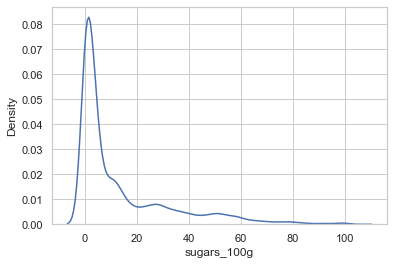

In [27]:
sns.kdeplot(data_numerical["sugars_100g"])

Distribution de **sucre après** centrage-reduction :

<AxesSubplot:xlabel='sugars_100g', ylabel='Density'>

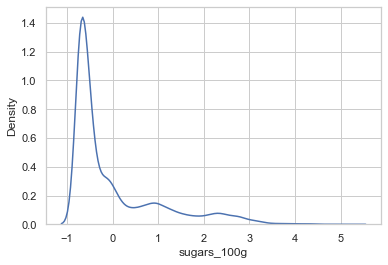

In [28]:
sns.kdeplot(df_scale["sugars_100g"])

## III Analyse statistique multivariée / verification des hypothèses

### ACP

In [36]:
import plotly.express as px
from sklearn.decomposition import PCA

features = col_nutriments

pca = PCA()
components = pca.fit_transform(df_scale[features])

# df <= comp + score ================================
components_and_score = []
i=0
for score in pca.explained_variance_ratio_:
    components_and_score.append(np.concatenate((pca.components_[i], [score*100])))
    i += 1

features_and_variance = features.copy()
features_and_variance.append("% explained variance")
print(pd.DataFrame(components_and_score,columns=features_and_variance,index = ["PC "+str(i) for i in range(1,len(features)+1)]))
# ================================================


labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}


col_to_color = df_scale["nutrition_grade_fr"]
#colors = {'a':'#33ff00', 'b':"#99ff00", 'c':'#FFCC00', 'd':"#ff6600", 'e':"#FF0000", 'O':'#808080'}
colors = {'e':"#FF0000", 'd':"#ff6600", 'c':'#FFCC00', 'b':"#99ff00", 'a':'#33ff00', 'O':'#808080'}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(2),
    color=col_to_color,
    hover_name=df_scale["product_name"],
    color_discrete_map=colors,
    opacity = 0.9
)
fig.update_traces(diagonal_visible=False)
fig.show()

      fiber_100g  proteins_100g  saturated-fat_100g  energy_100g  sugars_100g  \
PC 1    0.213271       0.315545            0.550903     0.634124     0.352814   
PC 2    0.106797       0.548822           -0.080581    -0.081354    -0.554170   
PC 3    0.912917      -0.050960           -0.356069     0.083515    -0.023393   
PC 4    0.009809      -0.515984           -0.255544     0.110749     0.323676   
PC 5    0.193309      -0.560654            0.587171    -0.003189    -0.548689   
PC 6    0.268754       0.126710            0.391350    -0.756319     0.402547   

      salt_100g  % explained variance  
PC 1   0.157678             34.666432  
PC 2   0.605947             27.567142  
PC 3  -0.172276             17.040790  
PC 4   0.742516              9.177136  
PC 5   0.049580              7.505086  
PC 6   0.156519              4.043414  


**Remarque : les variables étudiées ne permettent pas de constituer de nouvelles variables qui décrivent la plupart de la variance.\
Les variables étudiées pour cette acp ont de faibles correlations "simples" (linéaire) .**

**Remarque 2: les points sont de plus en plus étalés quand le score devient mauvais.\
Les aliments sont soumis a moins de restrictions quand le score devient mauvais (logique).**

Les nutriments officiellement cités pour l'évaluation du nutri score ne permettent pas une differenciation "simple" des nutri score

#### Representation des variables projetés sur les nouveaux axes

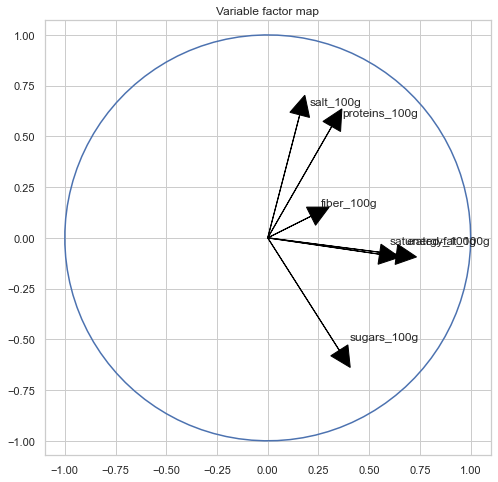

In [30]:
import matplotlib.pyplot as plt2

(fig, ax) = plt2.subplots(figsize=(8, 8))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.1,
             head_length=0.1, color=(0,0,0))

    plt2.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             col_nutriments[i])


an = np.linspace(0, 2 * np.pi, 100)
plt2.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt2.axis('equal')
ax.set_title('Variable factor map')
plt2.show()

**Remarque : Les variables suivantes semblent correlées, [energy, fat], [salt, proteins].**

### ANOVA
analyse de variance. (comparer la distribution d'une variable en fonction d'une variable categorielle)\
est-ce que le nutri-score influx sur nos variables ?

In [31]:
# fonction return V-interclasse / V-total
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(val_sugar-moyenne_y)**2 for val_sugar in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

ANOVAs des variables étudiées : 

Variance explained by saturated-fat_100g: 0.4552083200206098


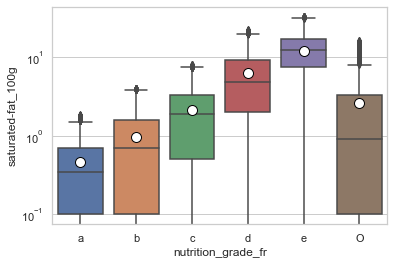

Variance explained by energy_100g: 0.3733363546887156


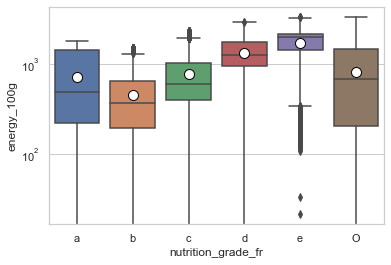

Variance explained by sugars_100g: 0.3320156944120968


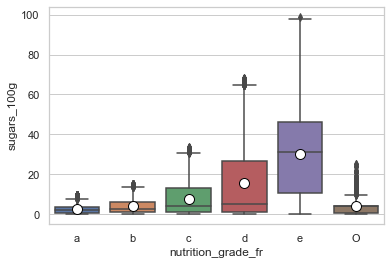

Variance explained by salt_100g: 0.11228469377481183


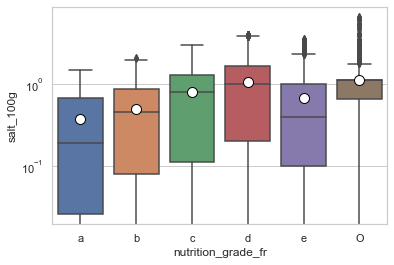

Variance explained by fiber_100g: 0.12353221784788274


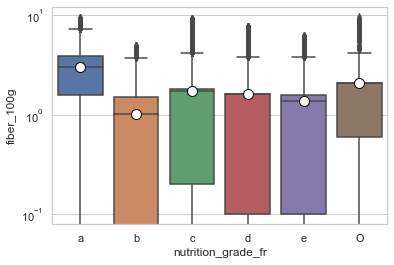

Variance explained by proteins_100g: 0.06904277947330852


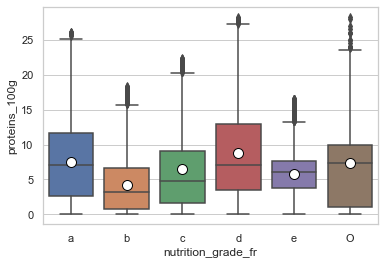

In [32]:
features = col_bad_nutriment + col_good_nutriment

for col in features:  
    print("Variance explained by "+col+ ": " + str(eta_squared(data_fr["nutrition_grade_fr"],data_fr[col])))
    
    ax = sns.boxplot(x="nutrition_grade_fr", y=col, order=["a","b","c","d","e","O"], data=data_fr, showmeans=True,
                meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"})
    if col in ["salt_100g","energy_100g","fiber_100g","saturated-fat_100g"]: ax.set_yscale("log")
    plt2.show()
 #   fig = px.box(df, x="nutrition_grade_fr", y=col, log_y=True)
  #  fig.show()
    


## Conclusion

### Hypothèse

Il y'a des differences notables entre **les differents nutri-scores** (voir PCA, ANOVA).\
On peut cependant constater une variance importante en considerant chaque nutriment individuelement.

Concernant **les articles sans présence de nutri-score**, on remarque qu'ils ont tendance à ressembler d'avantage aux articles classé nutri-score "a" ou "b" (voir PCA), voir "c" (voir ANOVA et bar Chart).

Enfin, ses résultats sont à prendre avec des grosses pincettes vu la quantité de fausses informations initial.



### Perspective

Possibilité de **prédire** le nutri score pour les **articles sans nutri-score**.\
Avec des algorithmes de classification (clustering). 